Create and visualise dataset from DB. 

First some technical initialisations:

In [1]:
!conda update -y dask

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.5.12
  latest version: 4.8.0

Please update conda by running

    $ conda update -n base -c defaults conda



# All requested packages already installed.



In [1]:
import pandas as pd
import psycopg2
from dask.distributed import Client
import dask.dataframe as dd
import dask
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import datetime
import numpy as np
from scipy.stats import pearsonr
import boto3, yaml
from sagemaker import get_execution_role
from dask import delayed
from datetime import timedelta
from sqlalchemy import create_engine

sns.set()
sns.set_style("whitegrid")
%matplotlib inline

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/psycopg2/__init__.py:144: UserWarning: The psycopg2 wheel package will be renamed from release 2.8; in order to keep installing from binary please use "pip install psycopg2-binary" instead. For details see: <http://initd.org/psycopg/docs/install.html#binary-install-from-pypi>.
  """)


In [27]:
client = Client('Dask-Scheduler.local-dask:8786')

In [35]:
client.get_versions(check=False)
client

Client Scheduler: tcp://Dask-Scheduler.local-dask:8786 Dashboard: http://Dask-Scheduler.local-dask:8787/status,Cluster Workers: 1 Cores: 2 Memory: 1.80 GB


For loading data:

In [2]:
db_host = 'sasse-era5.cluster-czjuk16bite5.eu-west-1.rds.amazonaws.com'
db_port = 5432
db_name = "postgres"
db_user = "contour_rw"
db_pass = "hkatAmryqRbmWEsyZQVvuExm"
conf_bucket  ='fmi-sasse-cloudformation'
conf_file    = 'smartmet.yaml'
loiste_bbox  = '25,62.7,31.4,66.4'
sssoy_bbox   = '24.5,60,30.6,63.5'

Load params:

In [7]:
s3 = boto3.resource('s3')

content_object = s3.Object(conf_bucket, conf_file)
file_content = content_object.get()['Body'].read().decode('utf-8')
config_dict = yaml.load(file_content)

params = config_dict['params']
met_params = set()
shortnames = True
for param, info in params.items():
    for f in info['aggregation']:
        if shortnames:
            met_params.add(f[1:]+' '+info['name'])
        else:
            met_params.add(f+'{'+param+'}')
met_params = list(met_params)

Update polygon and meteorlogical params. Lists are used in process_polygons function and while saving the data to db.

In [8]:
polygon_params = ['speed_self', 'angle_self', 'area_m2', 'area_diff', 'speed_pressure', 'angle_pressure', 'distance_to_pressure']
meta_params = ['id', 'storm_id', 'point_in_time', 'weather_parameter', 'low_limit', 'high_limit']
outage_params = ['outages', 'customers']
transformers_params = ['transformers', 'all_customers']
storm_params = polygon_params + met_params
all_params = meta_params + storm_params + outage_params + transformers_params

In [12]:
def get_dataset(start, end, meta_params, storm_params, outage_params, transformer_params, all_params):
    """ Gather dataset from db """
    print('Reading data for {}-{}...'.format(start, end))
    conn = psycopg2.connect("dbname='%s' user='%s' host='%s' password='%s'" % (db_name, db_user, db_host, db_pass))
    sql = """
        SELECT 
        """
    first = True
    for p in meta_params:
        if not first:
            sql += ','
        first = False
        sql += "a.{}".format(p)

    for p in storm_params:
            sql += ',"{}"'.format(p)
    for p in outage_params:
        sql += ',c.{}'.format(p)
    for p in transformer_params:
        sql += ',d.{}'.format(p)

    sql += """
        FROM
         sasse.stormcell a
         INNER JOIN sasse.stormcell_features b ON a.id = b.polygon_id
         INNER JOIN (
                  SELECT
                           b.id,
                           COUNT(1) AS outages,
                           SUM(customers) AS customers
                  FROM
                           sasse.outages a,
                           sasse.stormcell b
                  WHERE
                           date_trunc('hour', a.start AT TIME ZONE 'Europe/Helsinki' AT TIME ZONE 'UTC') + interval '1 hour' = point_in_time
                           AND ST_Intersects(st_setsrid (the_geom, 4326), st_setsrid (geom, 4326))
                           AND a.type NOT IN ('maintenance', 'planned')
                           AND point_in_time >= '{start}'
                           AND point_in_time <= '{end}'
                  GROUP BY
                           b.id) c ON c.id = a.id
         INNER JOIN (
                  SELECT
                           b.id,
                           COUNT(1) AS transformers,
                           SUM(customers) as all_customers
                  FROM
                           sasse.transformer a,
                           sasse.stormcell b
                  WHERE
                           ST_Intersects(st_setsrid (a.geom, 4326), st_setsrid (b.geom, 4326))
                           AND point_in_time >= '{start}'
                           AND point_in_time <= '{end}'
                  GROUP BY
                           b.id) d ON d.id = a.id         
    """.format(start=start, end=end)

    cursor = conn.cursor()
    cursor.execute(sql)
    results = cursor.fetchall()

    print('Found {} records for {}-{}.'.format(len(results), start, end))
    df = pd.DataFrame(results, columns=all_params)
    
    return df    

In [ ]:
%%time
starttime = datetime.datetime.strptime('2010-01-01', "%Y-%m-%d")
endtime = datetime.datetime.strptime('2019-01-01', "%Y-%m-%d")

dfs = []
start = starttime
while start <= endtime:
    end = start + timedelta(days=1)
    dfs.append(delayed(get_dataset)(start.strftime('%Y-%m-%d'), end.strftime('%Y-%m-%d'), meta_params, storm_params, outage_params, transformers_params, all_params))
    start = end

df = dask.compute(*dfs)
dataset = pd.concat(df)
dataset.sort_values(by=['point_in_time'], inplace=True)

CPU times: user 1min 14s, sys: 6.26 s, total: 1min 20s
Wall time: 5h 26min 50s


In [33]:
def save_dataset(df, table_name='classification_dataset'):
    """
    Save classification dataset into the db

    df : DataFrame
         DataFrame data
    """
    if df is None or len(df) < 1:
        return
    print('Storing classification set to db sasse.{}...'.format(table_name))
    #df.set_index('id', inplace=True)
    # db_name, db_user, db_host, db_pass
    engine = create_engine('postgresql://{user}:{passwd}@{host}:5432/{db}'.format(user=db_user,
                                                                                 passwd=db_pass,
                                                                                 host=db_host,
                                                                                 db=db_name))

    index_name = 'id'
    df.to_sql(table_name, engine, schema='sasse', if_exists='append', index=False)

save_dataset(dataset)

Storing classification set to db sasse.classification_dataset...


In [9]:
def load_dataset():
    conn = psycopg2.connect("dbname='%s' user='%s' host='%s' password='%s'" % (db_name, db_user, db_host, db_pass))
    sql = """SELECT "{}" FROM sasse.classification_dataset""".format('","'.join(all_params))

    cursor = conn.cursor()
    cursor.execute(sql)
    results = cursor.fetchall()
    df = pd.DataFrame(results, columns=all_params)
    df.set_index('point_in_time', inplace=True)
    return df
    

In [10]:
dataset = load_dataset()

In [11]:
df = dataset
dataset

,id,storm_id,weather_parameter,low_limit,high_limit,speed_self,angle_self,area_m2,area_diff,speed_pressure,...,MAX Snowfall,MIN Total column water vapor,AVG Temperature,AVG CAPE,MAX Temperature,SUM Snowfall,outages,customers,transformers,all_customers
point_in_time,,,,,,,,,,,,,,,,,,,,,
2010-03-01 11:00:00+00:00,25523,NULL,Pressure,0,1000,37.891652,358.664753,2323771677980,-66194231208,-999,...,0.0,2.0,272.0,4.0,282.0,1.0,1,20,13197,160204
2010-03-02 07:00:00+00:00,26094,299-WindGust-20-999,Pressure,0,1000,18.822604,26.619647,1292151513894,-43005741169,-999,...,0.0,4.0,271.0,4.0,274.0,1.0,1,365,13241,160548
2010-03-03 11:00:00+00:00,26718,NULL,Pressure,0,1000,16.113923,14.180199,840026369500,-28802655380,-999,...,0.0,4.0,271.0,7.0,275.0,0.0,2,430,13241,160548
2010-03-08 15:00:00+00:00,3802,3736-WindGust-15-999,WindGust,15,999,44.905630,47.889617,14108705828,-26598691777,-999,...,0.0,3.0,272.0,2.0,274.0,0.0,1,468,486,4368
2010-03-11 08:00:00+00:00,31132,4599-WindGust-15-999,Pressure,0,1000,24.854466,330.889873,921840453612,50921156172,-999,...,0.0,2.0,267.0,12.0,278.0,0.0,1,1223,5111,57971
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-10-26 03:00:00+00:00,921289,913853-WindGust-15-999,Pressure,0,1000,28.588143,23.746643,2497324964960,-112575968541,-999,...,0.0,6.0,274.0,9.0,283.0,0.0,4,26,11305,147159
2018-10-26 04:00:00+00:00,921292,913853-WindGust-15-999,Pressure,0,1000,15.742870,1.862460,2420221109955,-77103855005,-999,...,0.0,6.0,274.0,9.0,283.0,0.0,2,7,10790,141043
2018-10-26 05:00:00+00:00,921295,913853-WindGust-15-999,Pressure,0,1000,26.649282,31.962909,2324841355212,-95379754743,-999,...,0.0,6.0,274.0,9.0,281.0,0.0,1,9,9865,117462


Number of different types of polygons:

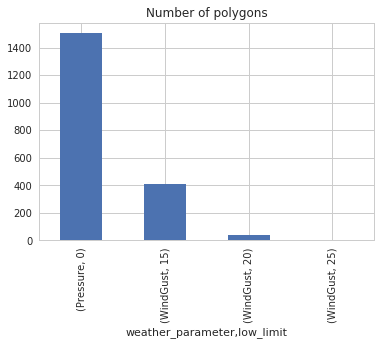

In [79]:
df.groupby(by=['weather_parameter', 'low_limit']).count()['id'].plot(kind='bar', title='Number of polygons')


In [80]:
df.groupby(by=['weather_parameter', 'low_limit']).count()['id']

weather_parameter  low_limit
Pressure           0            1504
WindGust           15            411
                   20             42
                   25              3
Name: id, dtype: int64

Number of outages caused by the storms:

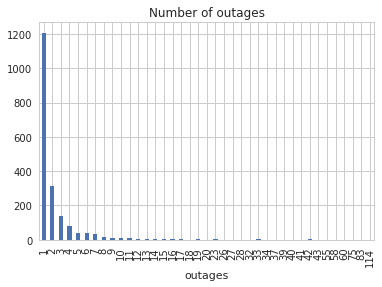

In [84]:
df.groupby(by=['outages']).count()['id'].plot(kind='bar', title='Number of outages')

In [82]:
df.groupby(by=['outages']).count()['id']

outages
1      1207
2       311
3       139
4        79
5        40
6        42
7        36
8        17
9        13
10       11
11       13
12        7
13        4
14        6
15        2
16        4
17        2
18        1
19        2
20        1
23        2
26        1
27        1
28        1
32        1
33        2
34        1
37        1
39        1
40        1
41        1
42        3
43        1
55        1
58        1
60        1
75        1
83        1
114       1
Name: id, dtype: int64

Correlation between storm objects and number of outages. Strong correlation exists.

In [14]:
def plot_pval(corr_df, ax):

    coeffmat = np.zeros((corr_df.shape[1], corr_df.shape[1]))
    pvalmat = np.zeros((corr_df.shape[1], corr_df.shape[1]))

    for i in range(corr_df.shape[1]):
        for j in range(corr_df.shape[1]):        
            corrtest = pearsonr(corr_df[corr_df.columns[i]], corr_df[corr_df.columns[j]])  

            coeffmat[i,j] = corrtest[0]
            pvalmat[i,j] = corrtest[1]

    pvalmat_df = pd.DataFrame(pvalmat, columns=corr_df.columns, index=corr_df.columns)
    #fig, ax = plt.subplots(figsize=(6,6))
    sns.heatmap(pvalmat_df, cmap="YlGnBu", annot=True, ax=ax)
    
def plot_corr(df):
    s = df[(df.loc[:,'weather_parameter'] == 'Pressure')].loc[:,'weather_parameter'].groupby(by=[pd.Grouper(freq='D')]).count()
    s2 = df[(df.loc[:,'weather_parameter'] == 'WindGust') & (df.loc[:,'low_limit'] == 15)].loc[:,'weather_parameter'].groupby(by=[pd.Grouper(freq='D')]).count()
    s3 = df[(df.loc[:,'weather_parameter'] == 'WindGust') & (df.loc[:,'low_limit'] == 20)].loc[:,'weather_parameter'].groupby(by=[pd.Grouper(freq='D')]).count()
    s4 = df[(df.loc[:,'weather_parameter'] == 'WindGust') & (df.loc[:,'low_limit'] == 25)].loc[:,'weather_parameter'].groupby(by=[pd.Grouper(freq='D')]).count()
    s5 = df.loc[:, 'outages'].groupby(by=[pd.Grouper(freq='D')]).sum()
    corr_df = pd.concat([s, s2, s3, s4, s5], axis=1, 
                        keys = ['Pressure', 'Wind Gust 15 m/s', 'Wind Gust 20 m/s', 'Wind Gust 25 m/s', 'Nro Outages'])
    corr_df.fillna(0, inplace=True)
    corr = corr_df.corr('pearson')

    fig, axes = plt.subplots(1, 2, figsize=(12,6))
    sns.heatmap(corr, cmap="YlGnBu", annot=True, ax=axes[0])
    axes[0].set_title('Correlation matrix')
    
    plot_pval(corr_df, ax=axes[1])
    axes[1].set_title('P-value test')
    plt.tight_layout()

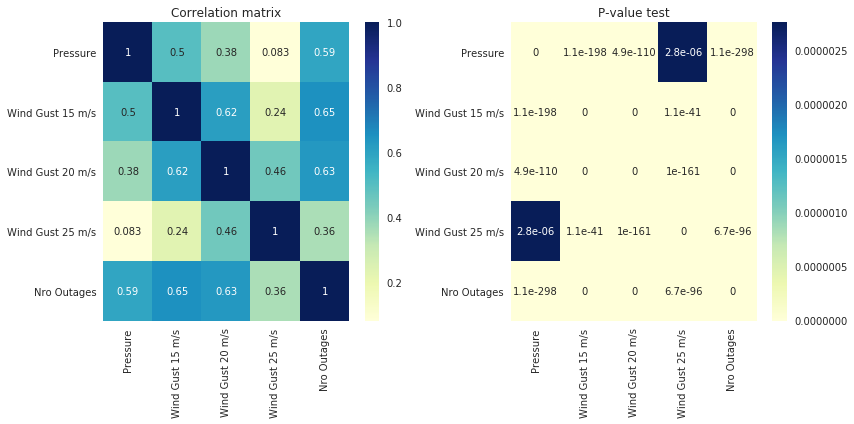

In [107]:
plot_corr(df)

Storm objects cause some outages. It can be seen from a timeseries of storm objects and outages as well.

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index represe

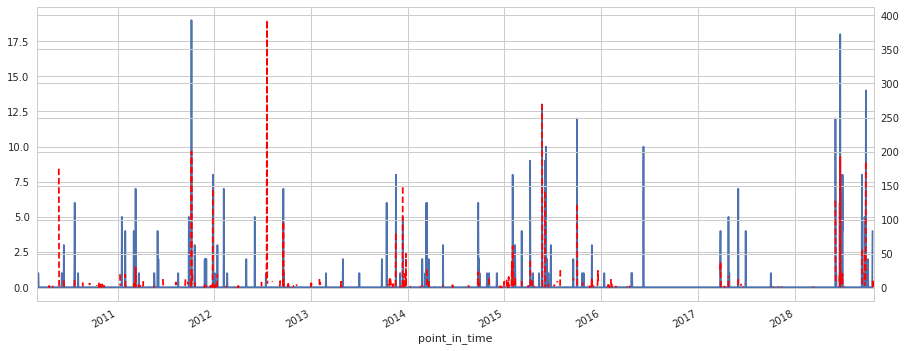

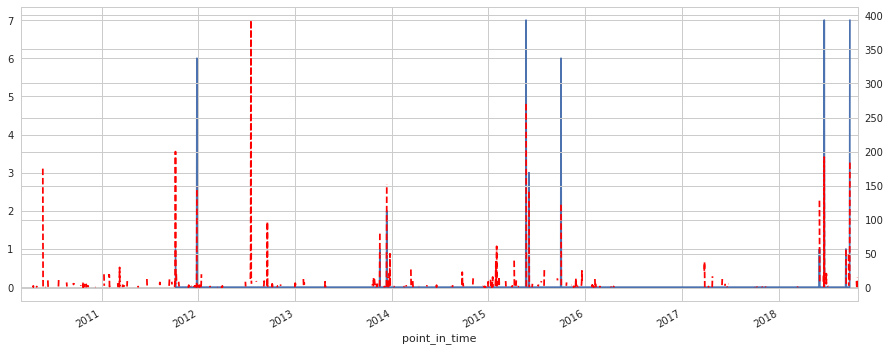

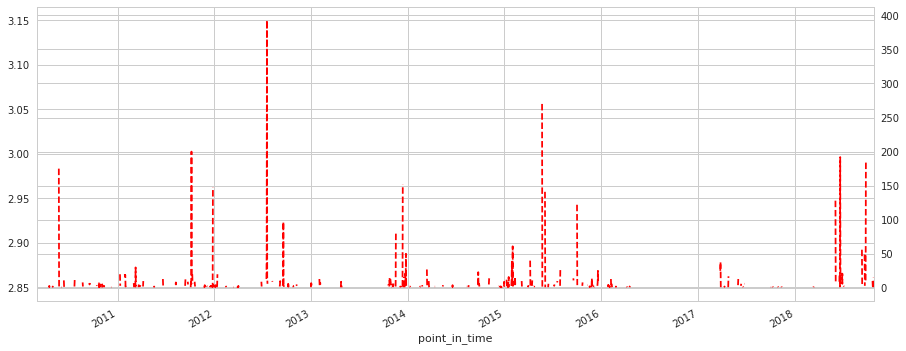

In [121]:
def plot_outages(df, parameter, limit):

    fig, ax = plt.subplots(figsize=(15,6))
    ax2 = ax.twinx()
    df[(df.loc[:,'weather_parameter'] == parameter) & (df.loc[:,'low_limit'] == limit)].loc[:,'weather_parameter'].groupby(by=[pd.Grouper(freq='D')]).count().plot(ax=ax)
    df.loc[:, 'outages'].groupby(by=[pd.Grouper(freq='D')]).sum().plot(ax=ax2, color='r', linestyle='dashed')
    fig.autofmt_xdate()
    
plot_outages(df, 'WindGust', 15)
plot_outages(df, 'WindGust', 20)
plot_outages(df, 'WindGust', 25)

Correlation between outages and different weather parameters (see two last rows). Significant correlation exists with at least: speed, area, temperature, standard deviation of the wind speed, total column water vapor, mixed layer height, CAPE, Dewpoint, total cloud cover, wind gust and pressure.

At least CAPE is most probably related to convective weather. 

P-value test passes for all parameters.

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/scipy/stats/stats.py:3010: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den


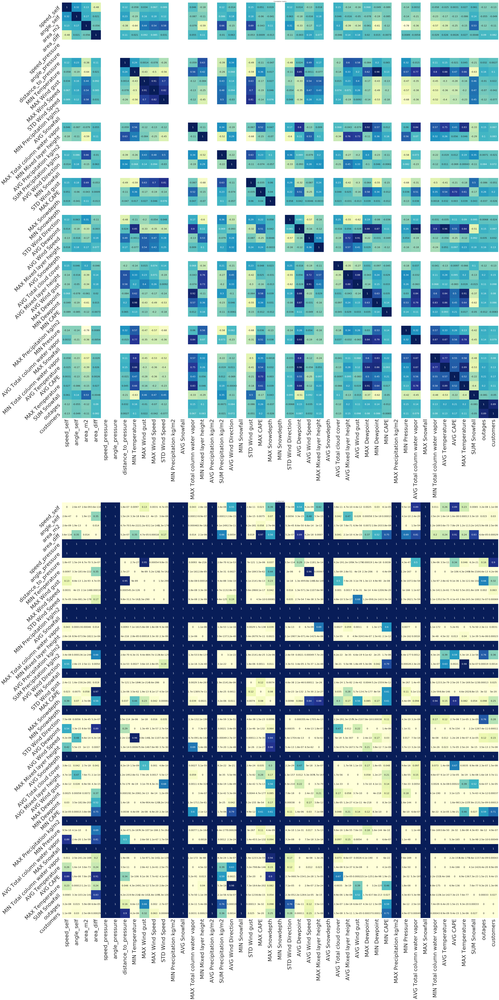

In [17]:
def plot_pval_(corr_df, ax):

    coeffmat = np.zeros((corr_df.shape[1], corr_df.shape[1]))
    pvalmat = np.zeros((corr_df.shape[1], corr_df.shape[1]))

    for i in range(corr_df.shape[1]):
        for j in range(corr_df.shape[1]):        
            corrtest = pearsonr(corr_df[corr_df.columns[i]], corr_df[corr_df.columns[j]])  

            coeffmat[i,j] = corrtest[0]
            pvalmat[i,j] = corrtest[1]

    pvalmat_df = pd.DataFrame(pvalmat, columns=corr_df.columns, index=corr_df.columns)
    g = sns.heatmap(pvalmat_df, cmap="YlGnBu", annot=True, ax=ax, annot_kws={"size": 20}, cbar=False)
    g.set_xticklabels(g.get_xmajorticklabels(), fontsize=45)
    g.set_yticklabels(g.get_ymajorticklabels(), fontsize=45, rotation=45)
    
df2 = df.loc[:, storm_params + outage_params].fillna(0)
corr = df2.corr('pearson')

#fig, axes = plt.subplots(1, 2, figsize=(45,30))
fig, axes = plt.subplots(2, 1, figsize=(60,120))
g = sns.heatmap(corr, cmap="YlGnBu", annot=True, ax=axes[0], annot_kws={"size": 20}, cbar=False)
g.set_xticklabels(g.get_xmajorticklabels(), fontsize=45)
g.set_yticklabels(g.get_ymajorticklabels(), fontsize=45, rotation=45)
axes[0].set_title('Correlation matrix')

plot_pval_(df2, ax=axes[1])
axes[1].set_title('P-value test')
plt.tight_layout()

Let's consider only winter months (from beginning of October to end of January). Now we don't have significant correlation between CAPE and outages but we do have much stronger correlation between most other parameters. 

P-value test do not pass any more, however. We have much less data (826 rows).

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/scipy/stats/stats.py:3010: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den


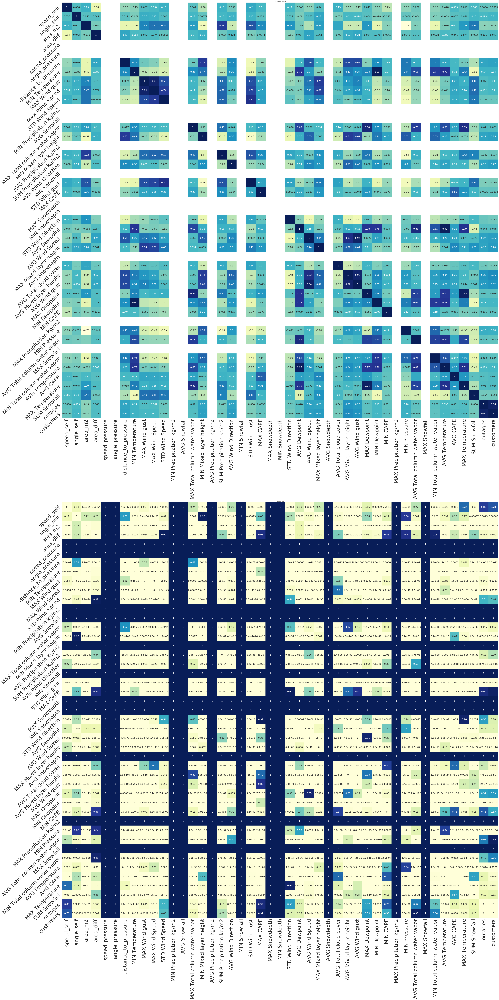

In [18]:
df3 = df.loc[(df.index.month >= 10) | (df.index.month <= 1), storm_params + outage_params].fillna(0)
corr = df3.corr('pearson')

#fig, axes = plt.subplots(1, 2, figsize=(45,30))
fig, axes = plt.subplots(2, 1, figsize=(60,120))
g = sns.heatmap(corr, cmap="YlGnBu", annot=True, ax=axes[0], annot_kws={"size": 20}, cbar=False)
g.set_xticklabels(g.get_xmajorticklabels(), fontsize=45)
g.set_yticklabels(g.get_ymajorticklabels(), fontsize=45, rotation=45)
axes[0].set_title('Correlation matrix')

plot_pval_(df3, ax=axes[1])
axes[1].set_title('P-value test')
plt.tight_layout()

In [19]:
df3

,speed_self,angle_self,area_m2,area_diff,speed_pressure,angle_pressure,distance_to_pressure,MIN Temperature,MAX Wind gust,MAX Wind Speed,...,MIN Pressure,AVG Total column water vapor,MAX Snowfall,MIN Total column water vapor,AVG Temperature,AVG CAPE,MAX Temperature,SUM Snowfall,outages,customers
point_in_time,,,,,,,,,,,,,,,,,,,,,
2010-10-12 04:00:00+00:00,3.701801,264.763988,1655168691910,-19536034754,-999,-999,0,269.0,21.0,14.0,...,95065.0,9.0,0.0,4.0,275.0,9.0,280.0,0.0,2,803
2010-10-14 07:00:00+00:00,12.733961,162.370807,2136587534625,-15836244904,-999,-999,0,271.0,26.0,16.0,...,94125.0,8.0,0.0,5.0,275.0,5.0,282.0,0.0,3,1052
2010-10-14 09:00:00+00:00,12.602670,197.195381,2141553842062,4854288116,-999,-999,0,272.0,30.0,20.0,...,95013.0,8.0,0.0,5.0,276.0,4.0,283.0,0.0,1,129
2010-10-15 07:00:00+00:00,14.428898,5.974223,2369409384132,-43322476512,-999,-999,0,271.0,27.0,19.0,...,94520.0,9.0,0.0,5.0,274.0,7.0,279.0,1.0,1,3
2010-10-15 08:00:00+00:00,16.138111,6.756476,2319466250705,-49943133427,-999,-999,0,272.0,27.0,19.0,...,94562.0,9.0,0.0,5.0,275.0,8.0,278.0,1.0,1,95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-10-26 03:00:00+00:00,28.588143,23.746643,2497324964960,-112575968541,-999,-999,0,270.0,21.0,15.0,...,95782.0,9.0,0.0,6.0,274.0,9.0,283.0,0.0,4,26
2018-10-26 04:00:00+00:00,15.742870,1.862460,2420221109955,-77103855005,-999,-999,0,270.0,22.0,15.0,...,95832.0,8.0,0.0,6.0,274.0,9.0,283.0,0.0,2,7
2018-10-26 05:00:00+00:00,26.649282,31.962909,2324841355212,-95379754743,-999,-999,0,270.0,22.0,15.0,...,95838.0,8.0,0.0,6.0,274.0,9.0,281.0,0.0,1,9
